## Análise de Tiroteios no RJ
### Trabalho da Pós em Arquitetura de Software

Este projeto utiliza dados públicos da API do Fogo Cruzado para analisar padrões de tiroteios e as vítimas na cidade do Rio de Janeiro.

### Objetivo

Identificar o risco de dado um tiroteio possa ter vítimas baseado em horário do dia, local e dia da semana.

In [2]:
#Importação das bibliotecas necessárias
import numpy as np
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from pickle import dump
from pickle import load
import folium
from folium.plugins import MarkerCluster
from branca.element import Template, MacroElement
from sklearn.metrics import classification_report, RocCurveDisplay, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier


### Funções para tratamento dos dados

Para categoriazar melhor os dados foi pensado em usar o campo data e montarmos a recorrência.
- A partir da hora tiramos a madrugada, manhã, tarde e noite (1-4)
- Dia da semana
-  Mês
<br>

**Serão utilizados os dados de latitude e longitude para a localização.**
<br>

**Para avaliação será recuperado o dado de vítima**
- quantidade de vítimas para cada evento de tiroteio (Feridos + Mortos)
- quantidade de mortos para cada evento de tiroteio
<br>

**A gravidade será calculada da seguinte maneira:**
- Sem Vítimas
- Sem Mortes (somente 1 ou mais feridos)
- Com mortes (com 1 ou mais mortes, com 0 ou mais feridos)

In [3]:
# Funções para tratamento dos dados
def periodo_do_dia(h):
    """
    Recebe um horário em formato de 24 horas (0-23) e retorna o período do dia:
    Arguments:
    h -- Hora no formato 0-23
    Returns:
    1 - madrugada (00:00-05:59)
    2 - manhã (06:00-11:59)
    3- tarde (12:00-17:59)
    4 - noite (18:00-23:59)
    """
    if h < 6: return 1
    elif h < 12: return 2
    elif h < 18: return 3
    else: return 4

def quantidade_vitimas_mortas(vitimas):
    """ Conta o número de vítimas mortas em uma lista de vítimas."""
    return contar_por_status(vitimas, 'Dead')

def parse_vitimas(v):
        """Converte uma string ou dicionário de vítimas em uma lista de vítimas."""
        if isinstance(v, str) and v.strip().startswith('['):
            try:
                return ast.literal_eval(v)
            except (ValueError, SyntaxError):
                return []
        return v if isinstance(v, list) else []

def contar_por_status(vitimas, status):
    """Conta o número de vítimas com um determinado status em uma lista de vítimas."""
    if not isinstance(vitimas, list):
        return 0
    return sum(1 for vit in vitimas if vit.get('situation') == status)

def classificar_gravidade(vitimas, mortos):
    """Classifica a gravidade de um evento com base no número de vítimas e mortos."""
    if vitimas == 0:
        return 'sem_vitima'
    elif mortos == 0:
        return 'ferido'
    else:
        return 'mortos'


In [4]:
#Leitura dos dados Atualmente marcados até a data
url = "https://raw.githubusercontent.com/cjcnetto/meus-mapas-api/main/MachineLearning/data/tiroteios_RJ.csv"
colunas = ['latitude', 'longitude', 'policeAction', 'date', 'victims']
dataset = pd.read_csv(url, usecols=colunas, skiprows=0, delimiter=',', encoding='utf-8-sig')

# Classificando os dados

#tratando os dados de vitimas
dataset['victims'] = dataset['victims'].apply(parse_vitimas)
dataset['total_victims'] = dataset['victims'].apply(lambda v: len(v) if isinstance(v, list) else 0)
dataset['deaths'] = dataset['victims'].apply(quantidade_vitimas_mortas)
#Tratando os dados temporais, vamos recuperar as frequenciais semanais e mensais e o periodo do dia em que o tiroteio ocorreu
dataset['date'] = pd.to_datetime(dataset['date'])
dataset['weekday'] = dataset['date'].apply(lambda date: date.weekday())
dataset['month'] = dataset['date'].dt.month
dataset['period'] = dataset['date'].dt.hour.apply(periodo_do_dia)
dataset['gravidade'] = dataset.apply(lambda row: classificar_gravidade(row['total_victims'], row['deaths']), axis=1)

#tratando os dados de localização que estavam em formato de dicionário, recuperando somente o nome
dataset.drop(['victims', 'date'], axis=1, inplace=True)
nova_ordem = ['policeAction', 'weekday', 'month', 'period', 'latitude', 'longitude', 'total_victims', 'deaths', 'gravidade']
dataset = dataset[nova_ordem]
dataset.head()


# Filtra somente eventos com ação policial
df_filtrado = dataset[dataset['policeAction'] == True].copy()

### Análise dos dados
Como podemos notar aqui  temos a maioria absoluta sem vitimas

| Tipo de Ocorrência | Critério               | Quantidade | Representação           |
| ------------------ | ---------------------- | ---------- | ----------------------- |
| Sem vítimas        | `total_victims == 0`   | **21.239** | 🟥 **Maioria absoluta** |
| 1 vítima           | `total_victims == 1`   | 3.945      | 🟧 Muito frequente      |
| 2 a 3 vítimas      | `total_victims == 2–3` | 1.539      | 🟨 Moderado             |
| 4 ou mais vítimas  | `total_victims >= 4`   | 320        | 🟩 Raro, porém crítico  |

A maioria dos eventos com vítimas tem 1 morte ou 1 ferido, e poucos têm mais de 4 vítimas/mortos.
Eventos com 4 ou mais mortos ou vítimas são raros, mas críticos.

| Número de Mortes | Critério        | Quantidade | Representação                 |
| ---------------- | --------------- | ---------- | ----------------------------- |
| Sem mortes       | `deaths == 0`   | **24.014** | 🟩 **Majoritário**            |
| 1 morte          | `deaths == 1`   | 2.365      | 🟨 Alta frequência relativa   |
| 2 a 3 mortes     | `deaths == 2–3` | 570        | 🟧 Ocorrência moderada        |
| 4 ou mais mortes | `deaths >= 4`   | 94         | 🟥 **Raríssimo, mas crítico** |

Baseado nessa ideia foi criado um algoritmo para definir e aplicar um fator de gravidade.

| Condição                       | Categoria atribuída | Significado prático                                   |
| ------------------------------ | ------------------- | ----------------------------------------------------- |
| `vitimas == 0`                 | `sem_vitima`        | Nenhum ferido ou morto                                |
| `mortos == 0 and vitimas >  0` | `ferido`            | Evento com apenas feridos                             |
| `mortos > 0`                   | `mortos`            | Eventos com pelo menos uma morte                      |


A partir dessa classificação foi notada essa distribuição.

|gravidade|contagem|percentual|
|---|---|---|
|ferido|2775|10\.26|
|mortos|3029|11\.2|
|sem\_vitima|21239|78\.54|

A mesma se encontra bem desbalanceada tendo o número de tiroteios sem vítimas altíssimo.

In [5]:
dataset['total_victims'].value_counts().sort_index()

total_victims
0     21239
1      3945
2      1136
3       403
4       171
5        59
6        35
7        21
8        11
9         6
10        1
11        2
12        3
13        3
14        1
15        4
23        1
28        1
33        1
Name: count, dtype: int64

In [6]:
(dataset['deaths'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))

,contagem,percentual
deaths,,
0,24014,88.80
1,2365,8.75
2,428,1.58
3,142,0.53
4,49,0.18
5,14,0.05
6,13,0.05
7,7,0.03
8,3,0.01


In [7]:
(dataset['gravidade'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))

,contagem,percentual
gravidade,,
ferido,2775,10.26
mortos,3029,11.20
sem_vitima,21239,78.54


### Redução de Escopo

Reduzindo o escopo para uma melhor distribuição, será considerado somente os tiroteios onde existe envolvimento de ação policial.

A partir dessa classificação foi notada essa distribuição

|gravidade|contagem|percentual|
|---|---|---|
|ferido|1937|25\.84|
|mortos|1483|19\.78|
|sem\_vitima|4076|54\.38|

Nesse ponto temos uma distribuição melhor dos dados. Logo faremos um filtro no nosso dataset.

In [8]:
# Função para gerar os gráficos
def plotar_distribuicao_gravidade_dupla(colunas_analise, dataset, titulo='Total'):
    for coluna in colunas_analise:
        tabela = pd.crosstab(dataset[coluna], dataset['gravidade'])

        ax = tabela.plot(kind='bar', stacked=True, colormap='Greens', figsize=(10, 6))
        ax.set_title(f'Distribuição por {coluna.capitalize()} - {titulo}')
        ax.set_xlabel(coluna.capitalize())
        ax.set_ylabel('Ocorrências')
        ax.legend(title='Gravidade', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        plt.tight_layout()
        plt.show()

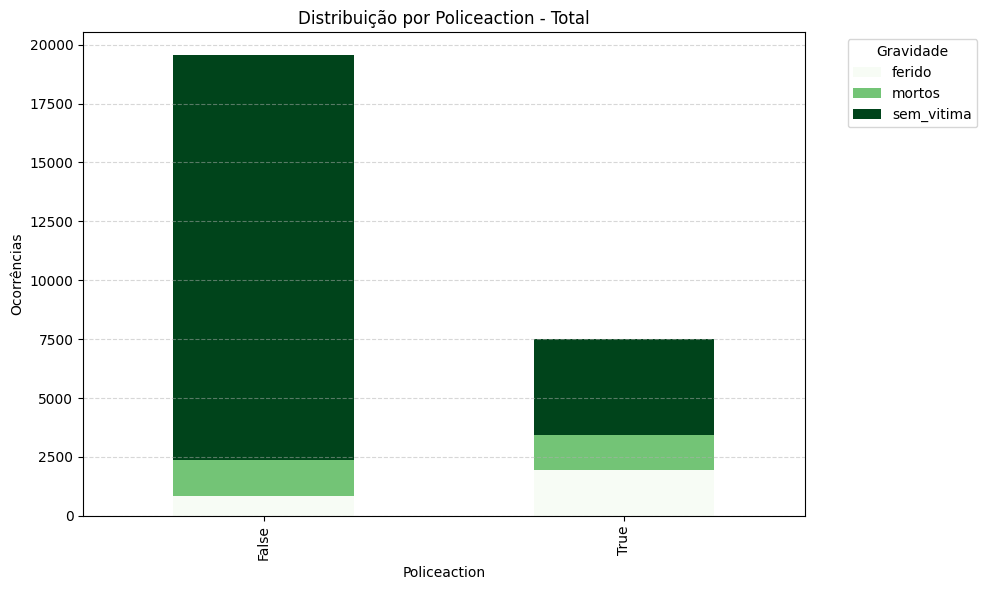

,contagem,percentual
gravidade,,
ferido,1937,25.84
mortos,1483,19.78
sem_vitima,4076,54.38


In [9]:
# Lista das colunas categóricas a serem analisadas
analise_global = ['policeAction']

plotar_distribuicao_gravidade_dupla(analise_global, dataset)

(dataset[dataset['policeAction'] == True]['gravidade'].value_counts(normalize=False)
         .sort_index()
         .to_frame('contagem')
         .assign(percentual=lambda df: (df['contagem'] / df['contagem'].sum() * 100).round(2)))


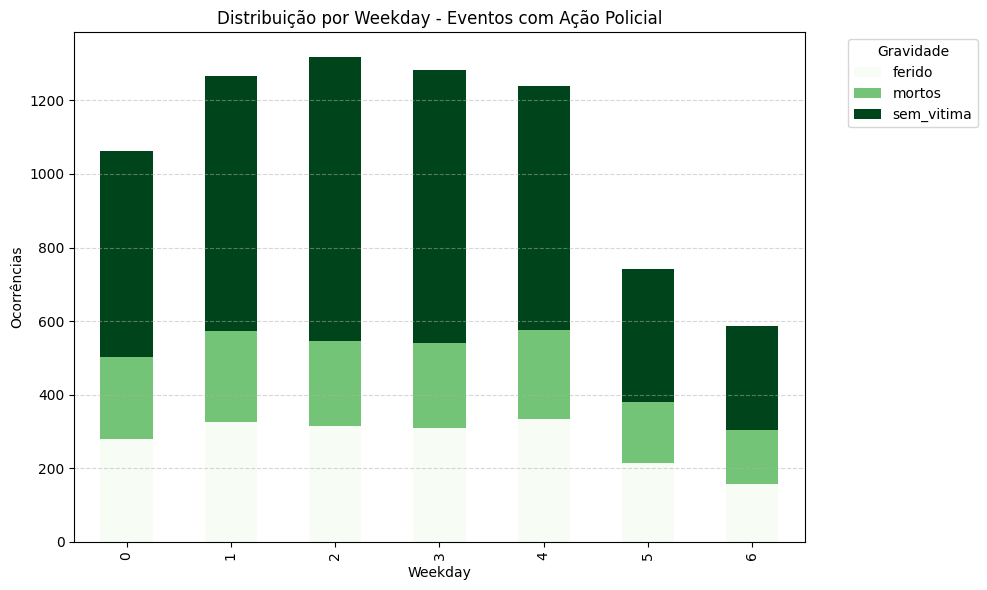

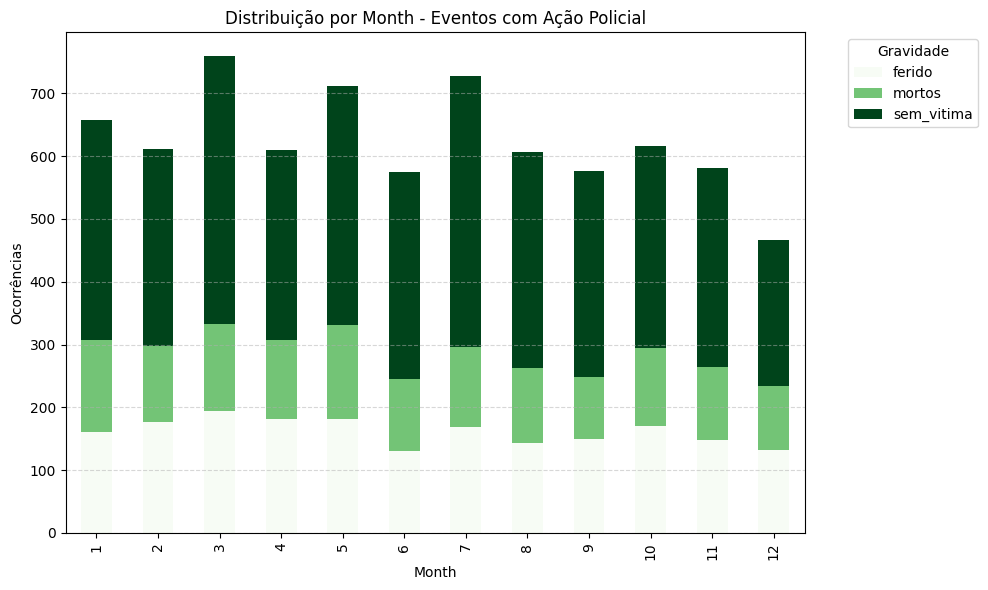

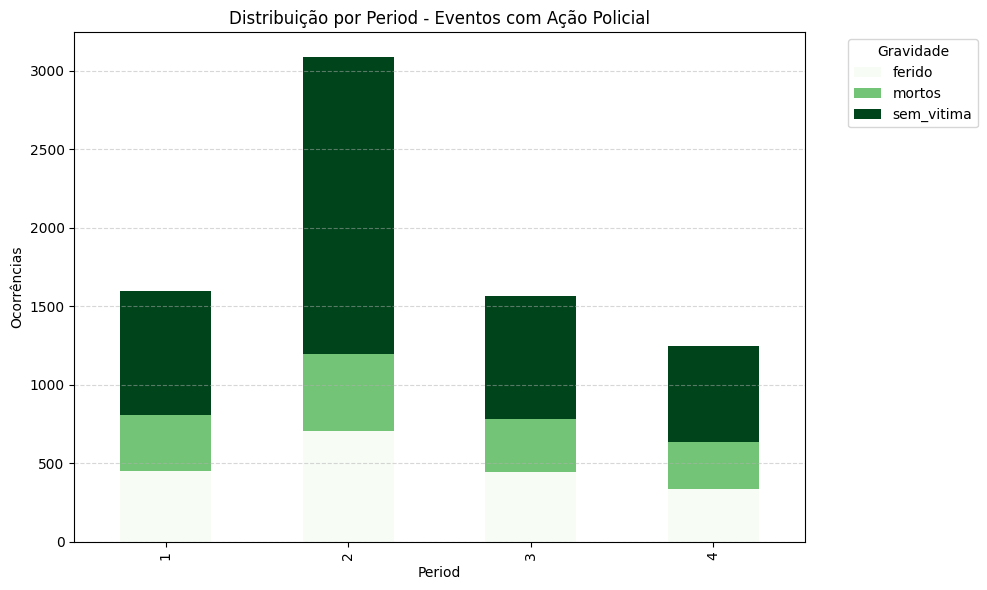

In [10]:
# Lista de colunas categóricas a analisar
analise_filtrada = ['weekday', 'month', 'period']

plotar_distribuicao_gravidade_dupla(analise_filtrada, df_filtrado, titulo='Eventos com Ação Policial')

In [11]:
# Cores por tipo de gravidade
cores_gravidade = {
    'Com mortos': 'black',
    'Sem mortos': 'orange',
    'Sem vítimas': 'green'
    }

# Filtrar dados válidos
df_mapa = df_filtrado.dropna(subset=['latitude', 'longitude', 'gravidade'])

# Criar o mapa centrado no RJ
mapa = folium.Map(location=[-22.9, -43.2], zoom_start=11, tiles='OpenStreetMap', width='80%',height='500px')

# Cluster para aglomerar pontos
cluster = MarkerCluster().add_to(mapa)

# Adicionar os marcadores
for _, row in df_mapa.iterrows():
    grav = row['gravidade']
    cor = cores_gravidade.get(grav, 'gray')
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5 + row['total_victims'] * 0.5,  # Tamanho do círculo proporcional ao número de vítimas
        color=cor,
        fill=True,
        fill_opacity=0.7,
        popup=f"Gravidade: {grav}<br>Latitude: {row['latitude']}<br>Longitude: {row['longitude']}<br>Período: {row['period']}"
    ).add_to(cluster)

# Legenda HTML (customizada)
legenda_html = """
{% macro html(this, kwargs) %}
<div style="
    position: fixed;
    top: 90px;
    left: 20px;
    width: 180px;
    height: 100px;
    background-color: white;
    border:2px solid grey;
    z-index:9999;
    font-size:14px;
    padding: 10px;
    box-shadow: 2px 2px 5px rgba(0,0,0,0.3);
">
<b>Legenda - Gravidade</b><br>
<span style="color:green;">●</span> sem_vitima<br>
<span style="color:orange;">●</span> ferido<br>
<span style="color:black;">●</span> mortos<br>
</div>
{% endmacro %}
"""

# Adiciona ao mapa
legenda = MacroElement()
legenda._template = Template(legenda_html)
mapa.get_root().add_child(legenda)

# Mostrar o mapa
mapa



### Apos uma análise dos modelos

**Resultado por modelo e por score para a gravidade definida**

**Análise de Dados Originais**

| Modelo                | F1\_macro ± std    | Accuracy ± std     | Balanced Acc ± std | Recall Com Mortos | Recall Sem Mortos | Recall Sem Vítimas | Observações Gerais                                                                   |
| --------------------- | ------------------ | ------------------ | ------------------ | ----------------- | ----------------- | ------------------ | ------------------------------------------------------------------------------------ |
| **Naive Bayes**       | 0.267 ± 0.0116     | 0.539 ± 0.0097     | 0.341 ± 0.0089     | 0.03              | 0.02              | **0.96**           | Muito enviesado para classe majoritária (`Sem vítimas`), ignora classes minoritárias |
| **SVM**               | 0.317 ± 0.0233     | 0.409 ± 0.0185     | 0.343 ± 0.0120     | 0.03              | **0.37**          | 0.59               | Fraco em `Com mortos`, mas consegue recuperar `Sem mortos`                           |
| **KNN**               | 0.367 ± 0.0205     | 0.457 ± 0.0187     | 0.368 ± 0.0198     | **0.22**          | 0.22              | 0.62               | Mais equilibrado entre classes, ainda que modesto em recall geral                    |
| **CART**              | 0.364 ± 0.0204     | 0.425 ± 0.0181     | 0.361 ± 0.0242     | 0.21              | 0.29              | 0.58               | Regular, sem grandes destaques ou falhas                                             |
| **Random Forest**     | 0.367 ± 0.0127     | 0.501 ± 0.0141     | **0.374 ± 0.0113** | 0.11              | 0.18              | 0.77               | Preciso em `Sem vítimas`, ruim nas outras; bom accuracy e balanceado                 |
| **Gradient Boosting** | **0.315 ± 0.0082** | **0.546 ± 0.0076** | 0.362 ± 0.0063     | 0.03              | 0.10              | **0.94**           | Alto desempenho em `Sem vítimas`, ignora `Com/Sem mortos`; accuracy mais alto        |

Analisando com os dados originais realmente a chance de acerto para as outras classes fica bem baixa logo farei um undersampling de todas as classes para o valor menos


In [12]:
np.random.seed(7) # definindo uma semente global
seed = 7 # semente aleatória

models = []
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))

# Correto
models.append(('RF', RandomForestClassifier()))
models.append(('GB', GradientBoostingClassifier()))

In [13]:
def gerar_analise(title, scoring, df, seed):
    print(f"\n📊 Análise de {title} - métrica: {scoring}\n")

    colunas = ['weekday', 'month', 'period', 'latitude', 'longitude', 'gravidade']
    df_classificado = df[colunas].copy()

    X = df_classificado.iloc[:, 0:5].values
    y = df_classificado.iloc[:, 5].values

    X_train, X_test, y_train, y_test = train_test_split(X, y,
        test_size=0.2, shuffle=True, random_state=seed, stratify=y)

    # Validação cruzada estratificada
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
    results = []
    names = []

    for name, model in models:
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        print(f"{name}: {cv_results.mean():.4f} ± {cv_results.std():.4f}")

        # Avaliação final no holdout
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        print(f"\n📌 Relatório de Classificação: {name}\n")
        print(classification_report(y_test, y_pred))

        ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
        plt.title(f"Matriz de Confusão - {name}")
        plt.show()

    # Comparação geral por boxplot
    fig = plt.figure(figsize=(12, 6))
    fig.suptitle(f'Comparação de Modelos - {scoring}')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.grid(True)
    plt.show()

    return results, names, X_train, X_test, y_train, y_test, kfold


#### Análise com os dados Originais


📊 Análise de Dados Originais - métrica: f1_weighted

NB: 0.4022 ± 0.0067

📌 Relatório de Classificação: NB

              precision    recall  f1-score   support

      ferido       0.28      0.02      0.04       387
      mortos       0.31      0.03      0.06       297
  sem_vitima       0.55      0.96      0.70       816

    accuracy                           0.54      1500
   macro avg       0.38      0.34      0.27      1500
weighted avg       0.43      0.54      0.40      1500



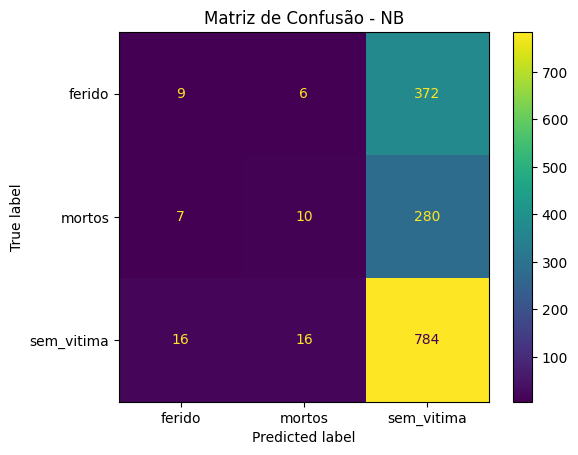

SVM: 0.3830 ± 0.0005

📌 Relatório de Classificação: SVM

              precision    recall  f1-score   support

      ferido       0.00      0.00      0.00       387
      mortos       0.00      0.00      0.00       297
  sem_vitima       0.54      1.00      0.70       816

    accuracy                           0.54      1500
   macro avg       0.18      0.33      0.23      1500
weighted avg       0.30      0.54      0.38      1500



c:\work\meus-mapas-api\meus_mapas_env\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\work\meus-mapas-api\meus_mapas_env\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\work\meus-mapas-api\meus_mapas_env\Lib\site-packages\sklearn\metrics\_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result

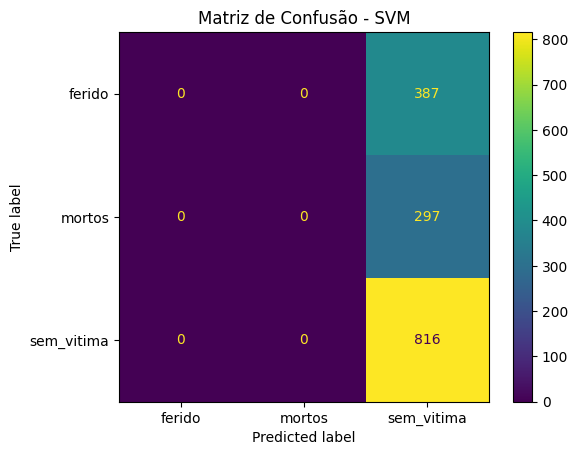

KNN: 0.4273 ± 0.0173

📌 Relatório de Classificação: KNN

              precision    recall  f1-score   support

      ferido       0.27      0.29      0.28       387
      mortos       0.24      0.16      0.20       297
  sem_vitima       0.58      0.64      0.61       816

    accuracy                           0.45      1500
   macro avg       0.37      0.36      0.36      1500
weighted avg       0.44      0.45      0.44      1500



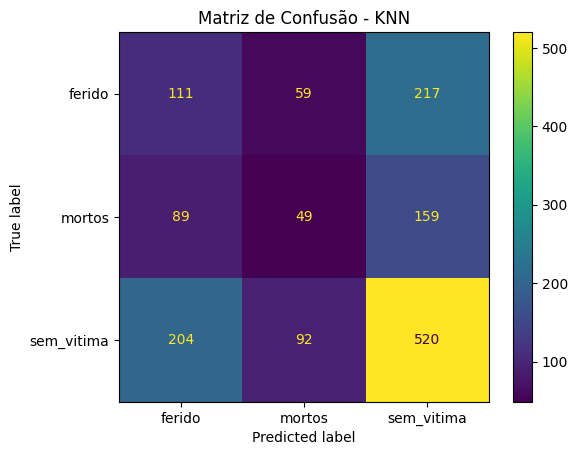

CART: 0.4248 ± 0.0248

📌 Relatório de Classificação: CART

              precision    recall  f1-score   support

      ferido       0.32      0.34      0.33       387
      mortos       0.24      0.28      0.26       297
  sem_vitima       0.61      0.56      0.59       816

    accuracy                           0.45      1500
   macro avg       0.39      0.39      0.39      1500
weighted avg       0.46      0.45      0.46      1500



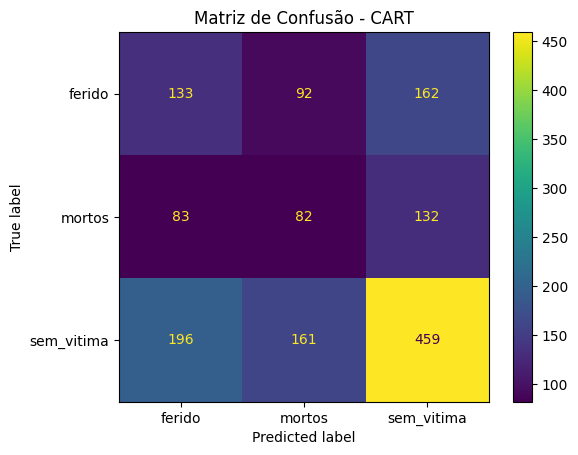

RF: 0.4567 ± 0.0160

📌 Relatório de Classificação: RF

              precision    recall  f1-score   support

      ferido       0.35      0.23      0.28       387
      mortos       0.34      0.17      0.23       297
  sem_vitima       0.58      0.79      0.67       816

    accuracy                           0.52      1500
   macro avg       0.43      0.40      0.39      1500
weighted avg       0.48      0.52      0.48      1500



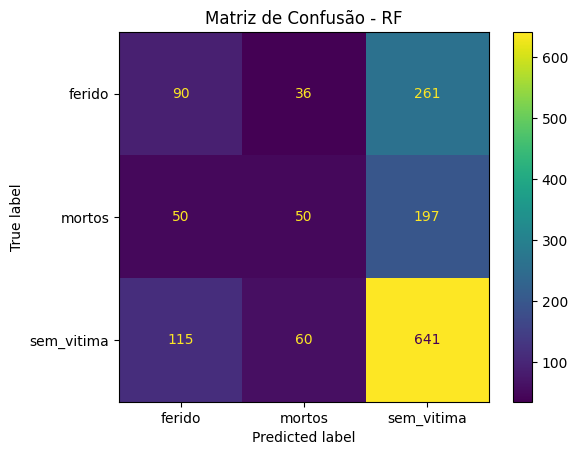

GB: 0.4446 ± 0.0132

📌 Relatório de Classificação: GB

              precision    recall  f1-score   support

      ferido       0.44      0.14      0.21       387
      mortos       0.34      0.04      0.07       297
  sem_vitima       0.56      0.93      0.70       816

    accuracy                           0.55      1500
   macro avg       0.45      0.37      0.33      1500
weighted avg       0.49      0.55      0.45      1500



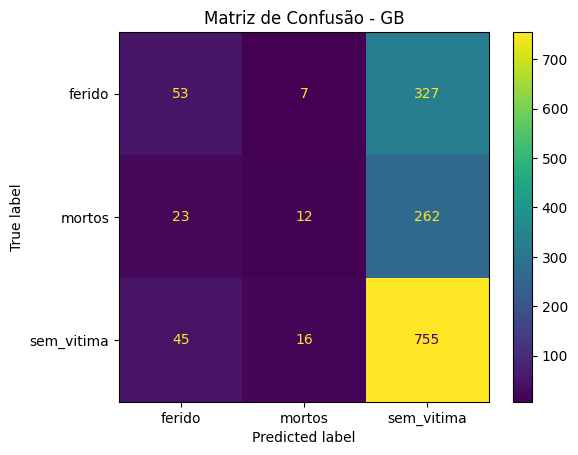

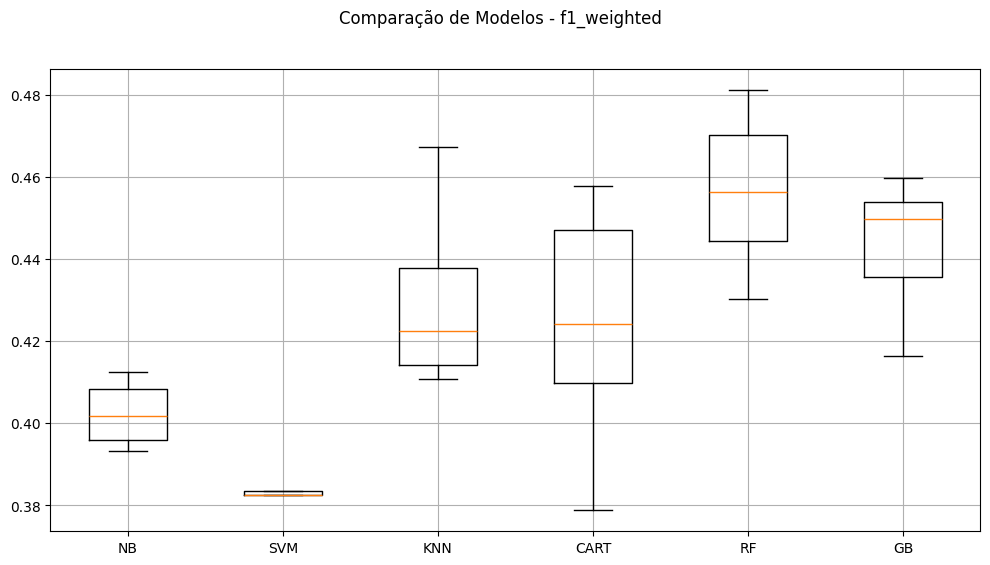

In [14]:
results, names, X_train, X_test, y_train, y_test, kfold = dt_original_f1 = gerar_analise('Dados Originais', 'f1_weighted', df_filtrado, seed)

#### Análise com um undersampling na classe sem vítimas e sem mortos para balancear com as outras.

📊 Tabela Resumo – Classificação Multiclasse (3 classes balanceadas)


| Modelo                | F1\_macro ± std   | Accuracy ± std    | Balanced Acc ± std | Recall Com Mortos | Recall Sem Mortos | Recall Sem Vítimas | Observações Gerais                                              |
| --------------------- | ----------------- | ----------------- | ------------------ | ----------------- | ----------------- | ------------------ | --------------------------------------------------------------- |
| **Naive Bayes**       | 0.368 ± 0.016     | 0.388 ± 0.013     | 0.388 ± 0.013      | 0.30              | 0.22              | **0.62**           | Fraco em `Sem mortos`, bom em `Sem vítimas`.                    |
| **SVM**               | 0.332 ± 0.022     | 0.349 ± 0.022     | 0.349 ± 0.022      | **0.15**          | 0.39              | 0.45               | Ignora `Com mortos`; pior modelo geral em equilíbrio.           |
| **KNN**               | 0.348 ± 0.025     | 0.353 ± 0.024     | 0.353 ± 0.024      | **0.43**          | 0.36              | 0.26               | Melhor para `Com mortos`, mas ruim para `Sem vítimas`.          |
| **CART**              | 0.371 ± 0.026     | 0.372 ± 0.021     | 0.374 ± 0.020      | 0.35              | **0.41**          | 0.43               | Simples, estável e consistente.                                 |
| **Random Forest**     | 0.385 ± 0.019     | 0.386 ± 0.019     | 0.386 ± 0.019      | 0.31              | 0.37              | 0.46               | Equilibrado entre todas as classes.                             |
| **Gradient Boosting** | **0.388 ± 0.021** | **0.392 ± 0.022** | **0.392 ± 0.022**  | 0.31              | 0.34              | **0.53**           | 🔥 Melhor modelo geral, especialmente forte para `Sem vítimas`. |



Baseado nesses resultados com o recall vou tentar umas melhorias no Gradient BOOST e no CART, ensinado na disciplina.


In [15]:
# Separar as classes
sem_vitimas = df_filtrado[df_filtrado['gravidade'] == 'sem_vitima']
sem_mortos = df_filtrado[df_filtrado['gravidade'] == 'ferido']
com_mortos = df_filtrado[df_filtrado['gravidade'] == 'mortos']

n_min = 1483  # tamanho da menor classe (Com mortos)

df_balanceado = pd.concat([
    sem_vitimas.sample(n=n_min, random_state=7),
    sem_mortos.sample(n=n_min, random_state=7),
    com_mortos  # já tem 1483
])


📊 Análise de Dados Balanceados - métrica: f1_weighted

NB: 0.3681 ± 0.0228

📌 Relatório de Classificação: NB

              precision    recall  f1-score   support

      ferido       0.36      0.19      0.25       297
      mortos       0.35      0.29      0.32       297
  sem_vitima       0.37      0.61      0.46       296

    accuracy                           0.36       890
   macro avg       0.36      0.36      0.34       890
weighted avg       0.36      0.36      0.34       890



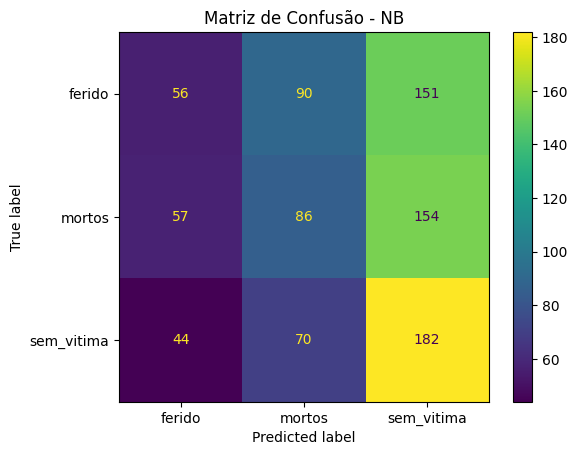

SVM: 0.3017 ± 0.0291

📌 Relatório de Classificação: SVM

              precision    recall  f1-score   support

      ferido       0.36      0.28      0.32       297
      mortos       0.37      0.28      0.32       297
  sem_vitima       0.34      0.50      0.41       296

    accuracy                           0.35       890
   macro avg       0.36      0.35      0.35       890
weighted avg       0.36      0.35      0.35       890



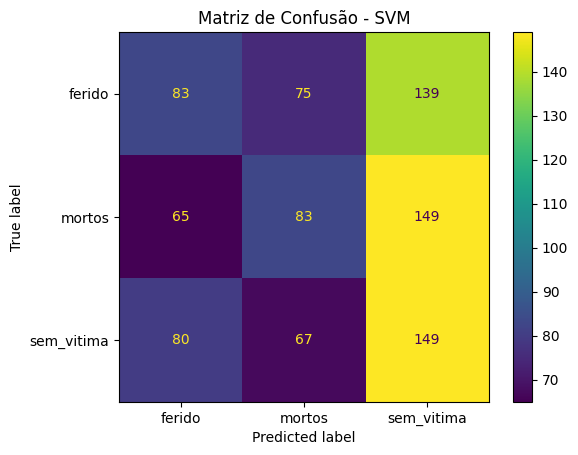

KNN: 0.3611 ± 0.0190

📌 Relatório de Classificação: KNN

              precision    recall  f1-score   support

      ferido       0.34      0.46      0.39       297
      mortos       0.34      0.32      0.33       297
  sem_vitima       0.40      0.28      0.33       296

    accuracy                           0.35       890
   macro avg       0.36      0.35      0.35       890
weighted avg       0.36      0.35      0.35       890



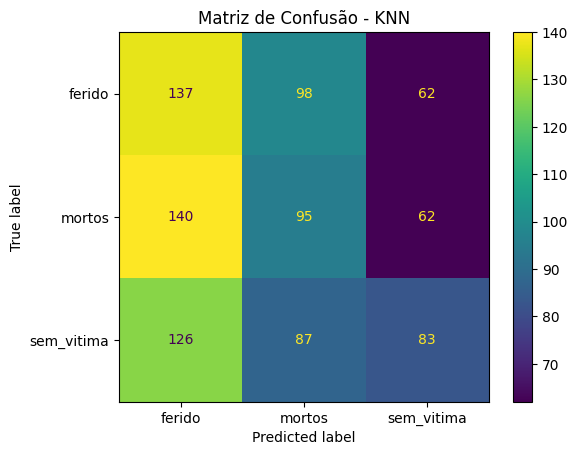

CART: 0.3537 ± 0.0260

📌 Relatório de Classificação: CART

              precision    recall  f1-score   support

      ferido       0.39      0.36      0.38       297
      mortos       0.34      0.34      0.34       297
  sem_vitima       0.39      0.43      0.41       296

    accuracy                           0.38       890
   macro avg       0.38      0.38      0.37       890
weighted avg       0.38      0.38      0.37       890



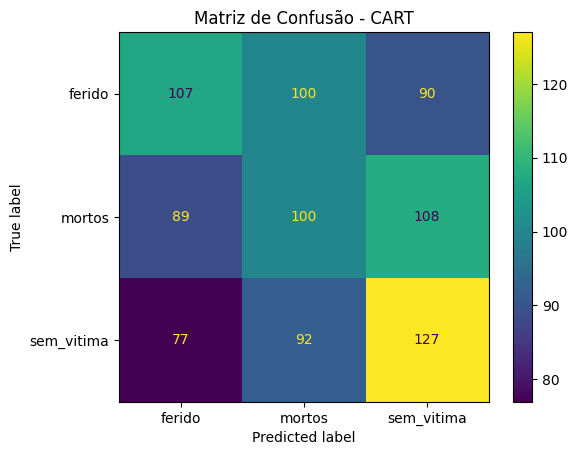

RF: 0.3923 ± 0.0268

📌 Relatório de Classificação: RF

              precision    recall  f1-score   support

      ferido       0.35      0.33      0.34       297
      mortos       0.32      0.29      0.31       297
  sem_vitima       0.38      0.44      0.41       296

    accuracy                           0.35       890
   macro avg       0.35      0.35      0.35       890
weighted avg       0.35      0.35      0.35       890



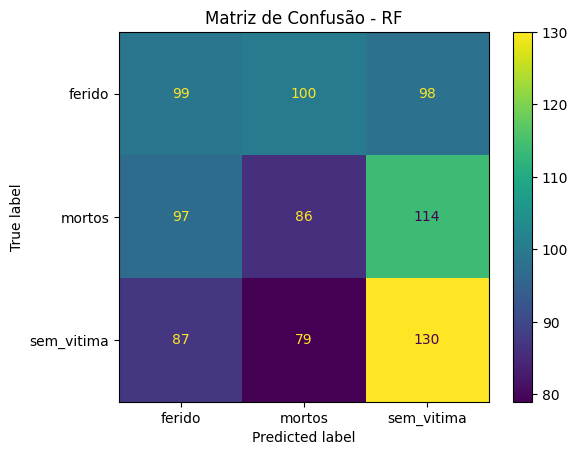

GB: 0.3968 ± 0.0271

📌 Relatório de Classificação: GB

              precision    recall  f1-score   support

      ferido       0.40      0.31      0.35       297
      mortos       0.36      0.34      0.35       297
  sem_vitima       0.41      0.53      0.46       296

    accuracy                           0.39       890
   macro avg       0.39      0.39      0.39       890
weighted avg       0.39      0.39      0.39       890



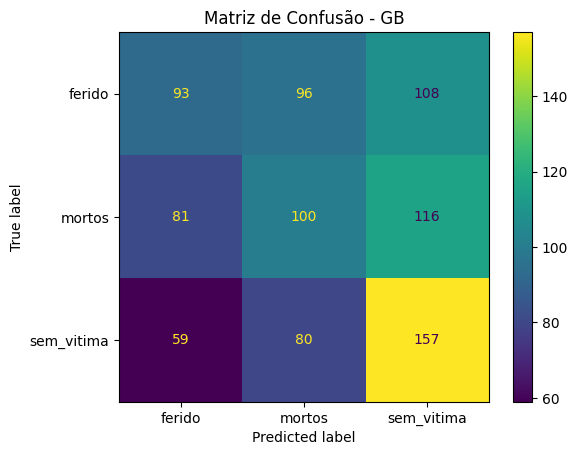

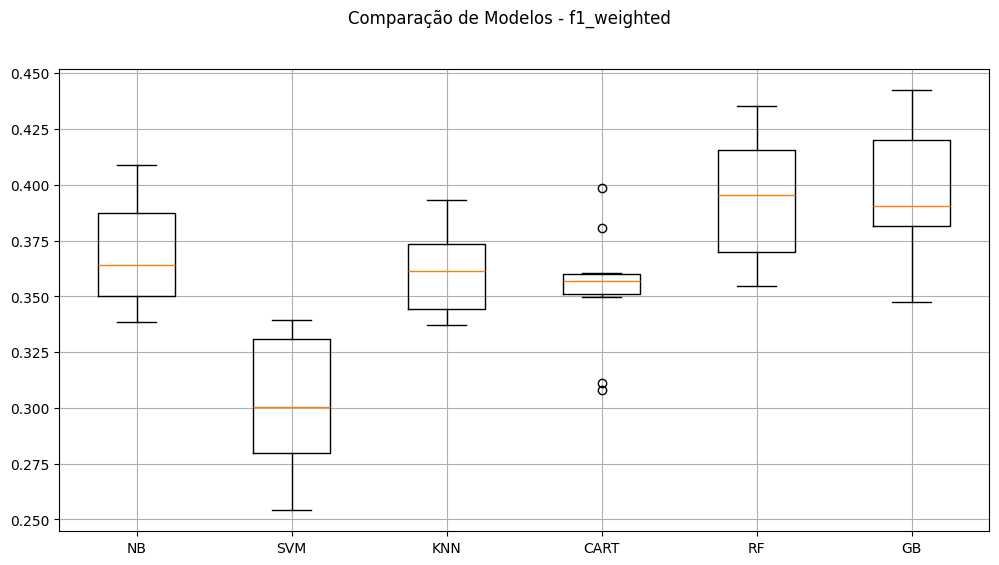

In [16]:
scoring = 'f1_weighted'
results, names, X_train, X_test, y_train, y_test, kfold = gerar_analise('Dados Balanceados', scoring, df_balanceado, seed)

### Analisando a construção com

In [ ]:
np.random.seed(7) # definindo uma semente global para este bloco

# Listas para armazenar os armazenar os pipelines e os resultados para todas as visões do dataset
pipelines = []
results = []
names = []


# Criando os elementos do pipeline

# Algoritmos que serão utilizados
knn = ('KNN', KNeighborsClassifier())
cart = ('CART', DecisionTreeClassifier())
naive_bayes = ('NB', GaussianNB())
svm = ('SVM', SVC())
rf = ('RF', RandomForestClassifier())
gb = ('GB', GradientBoostingClassifier())

# Transformações que serão utilizadas
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())


# Montando os pipelines

# Dataset original
pipelines.append(('KNN-orig', Pipeline([knn])))
pipelines.append(('CART-orig', Pipeline([cart])))
pipelines.append(('NB-orig', Pipeline([naive_bayes])))
pipelines.append(('SVM-orig', Pipeline([svm])))
pipelines.append(('RF-orig', Pipeline([rf])))
pipelines.append(('GB-orig', Pipeline([gb])))

# Dataset Padronizado
pipelines.append(('KNN-padr', Pipeline([standard_scaler, knn])))
pipelines.append(('CART-padr', Pipeline([standard_scaler, cart])))
pipelines.append(('NB-padr', Pipeline([standard_scaler, naive_bayes])))
pipelines.append(('SVM-padr', Pipeline([standard_scaler, svm])))
pipelines.append(('RF-padr', Pipeline([standard_scaler, rf])))
pipelines.append(('GB-padr', Pipeline([standard_scaler, gb])))

# Dataset Normalizado
pipelines.append(('KNN-norm', Pipeline([min_max_scaler, knn])))
pipelines.append(('CART-norm', Pipeline([min_max_scaler, cart])))
pipelines.append(('NB-norm', Pipeline([min_max_scaler, naive_bayes])))
pipelines.append(('SVM-norm', Pipeline([min_max_scaler, svm])))
pipelines.append(('RF-norm', Pipeline([min_max_scaler, rf])))
pipelines.append(('GB-norm', Pipeline([min_max_scaler, gb])))

# Executando os pipelines
for name, model in pipelines:
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %.3f (%.3f)" % (name, cv_results.mean(), cv_results.std()) # formatando para 3 casas decimais
    print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure(figsize=(25,6))
fig.suptitle('Comparação dos Modelos - Dataset orginal, padronizado e normalizado')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names, rotation=90)
plt.show()

KNN-orig: 0.361 (0.019)
CART-orig: 0.354 (0.032)
NB-orig: 0.368 (0.023)
SVM-orig: 0.302 (0.029)
RF-orig: 0.387 (0.021)
GB-orig: 0.396 (0.026)
KNN-padr: 0.366 (0.012)
CART-padr: 0.354 (0.029)
NB-padr: 0.368 (0.023)
SVM-padr: 0.381 (0.026)
RF-padr: 0.389 (0.029)
GB-padr: 0.396 (0.028)
KNN-norm: 0.352 (0.015)
CART-norm: 0.351 (0.023)
NB-norm: 0.368 (0.023)
SVM-norm: 0.390 (0.021)
RF-norm: 0.399 (0.026)


In [ ]:
# Tuning do RF

np.random.seed(7) # definindo uma semente global para este bloco

pipelines = []

# Definindo os componentes do pipeline
rf = ('RF', RandomForestClassifier())
standard_scaler = ('StandardScaler', StandardScaler())
min_max_scaler = ('MinMaxScaler', MinMaxScaler())

pipelines.append(('RF-orig', Pipeline([rf])))
pipelines.append(('RF-padr', Pipeline([standard_scaler, rf])))
pipelines.append(('RF-norm', Pipeline([min_max_scaler, rf])))

param_grid = {
    'RF__n_estimators'        : [10, 50, 100],
    'RF__criterion'        : ['gini', 'entropy', 'log_loss'],
    'RF__max_depth'        : [None, 5, 10, 20, 30],
    'RF__min_samples_split': [2, 5, 10],
    'RF__min_samples_leaf' : [1, 2, 4],
    'RF__max_features'     : [None, 'sqrt', 'log2']
}

# Prepara e executa o GridSearchCV
for name, model in pipelines:
    grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)
    grid.fit(X_train, y_train)
    # imprime a melhor configuração
    print("Sem tratamento de missings: %s - Melhor: %f usando %s" % (name, grid.best_score_, grid.best_params_))